# Flow Matching

## Basics of normalising flows

In **flow matching**, we try to learn a **vector field** $\pmb{v}(\pmb{x}, t)$ that transports samples along a **probability path** $p(\pmb{x}, t)$ from a source distribution $p(\pmb{x}, 0)$ to the data distribution $p(\pmb{x}, T)$, where each individual sample follows a **flow map** $\pmb{\phi}(\pmb{x}, t)$. These objects are all interelated via the following equations:

- **Flow**: $$\frac{\mathrm{d}\pmb{\phi}(\pmb{x}, t)}{\mathrm{d}t} = \pmb{v}\left(\pmb{\phi}(\pmb{x}, t), t\right) \quad \text{s.t.} \quad \pmb{\phi}(\pmb{x}, 0) = \pmb{x}$$
- **Continuity** $$\frac{\partial p(\pmb{x}, t)}{\partial t} = - \nabla_{\pmb{x}} \cdot \left(p(\pmb{x}, t) \pmb{v}(\pmb{x}, t)\right)$$
- **Pushforward**: $$p(\pmb{x},t) = p\bigl(\pmb{\phi}^{-1}(\pmb{x},t),\,0\bigr)\; \bigl|\det \nabla_{\pmb{x}}\pmb{\phi}^{-1}(\pmb{x},t)\bigr|$$
- **Log likelihood**: $$\frac{\mathrm{d} \log p(\pmb{\phi}(\pmb{x}, t), t)}{\mathrm{d} t} = -\nabla_{\pmb{x}} \cdot  \pmb{v}\left(\pmb{\phi}(\pmb{x}, t), t\right)$$

## Basics of flow matching

### Probability paths

Assuming we have samples of a **data distribution** $q(\pmb{x}_1)$, we suppose that we can construct a **marginal probability path** $p(\pmb{x}, t)$
$$
p(\pmb{x}, t) = \int p(\pmb{x}, t \mid \pmb{x}_1) q(\pmb{x}_1) \mathrm{d}\pmb{x}_1
$$
with a **conditional probability path** $p(\pmb{x}, t \mid \pmb{x}_1)$, which we define.

### Vector fields

Due to the continuity equation, there exists a **conditional vector field** $\pmb{v}(\pmb{x}, t \mid \pmb{x}_1)$ that transports samples along $p(\pmb{x}, t \mid \pmb{x}_1)$ – which should be readily obtained if they are simple. Additionally, the definition of the marginal probability path $p(\pmb{x}, t)$ along with the continuity equation implies the existence of a **marginal vector field** $\pmb{v}(\pmb{x}, t)$
$$
\begin{aligned}
\frac{\partial p(\pmb{x}, t)}{\partial t} &= - \nabla_{\pmb{x}} \cdot \left(\pmb{v}(\pmb{x}, t) p(\pmb{x}, t)\right) \\
&= \frac{\partial}{\partial t} \int p(\pmb{x}, t \mid \pmb{x}_1) q(\pmb{x}_1) \mathrm{d}\pmb{x}_1 \\
&= \int \frac{\partial p(\pmb{x}, t \mid \pmb{x}_1)}{\partial t}  q(\pmb{x}_1) \mathrm{d}\pmb{x}_1 \\
&= \int - \nabla_{\pmb{x}} \cdot \left(\pmb{v}(\pmb{x}, t \mid \pmb{x}_1) p(\pmb{x}, t \mid \pmb{x}_1) \right)  q(\pmb{x}_1) \mathrm{d}\pmb{x}_1 \\
&= - \nabla_{\pmb{x}} \cdot \int \pmb{v}(\pmb{x}, t \mid \pmb{x}_1) p(\pmb{x}, t \mid \pmb{x}_1) q(\pmb{x}_1) \mathrm{d}\pmb{x}_1 \\
\implies \pmb{v}(\pmb{x}, t) &= \frac{1}{p(\pmb{x}, t)} \int \pmb{v}(\pmb{x}, t \mid \pmb{x}_1) p(\pmb{x}, t \mid \pmb{x}_1) q(\pmb{x}_1) \mathrm{d}\pmb{x}_1,
\end{aligned}
$$

### Loss function

Ultimately, we want to train a neural-network-parameterised vector field $\pmb{u}(\pmb{x}, t, \theta)$ to match the marginal vector field $\pmb{v}(\pmb{x}, t)$. To do this, we must define a valid [Bregman divergence](https://en.wikipedia.org/wiki/Bregman_divergence) $D(\pmb{u} \parallel \pmb{v})$ and a time density $w(t)$. With these and using the definitions above we can see that matching the conditional vector fields is equivalent:

$$
\begin{aligned}
\nabla_\theta \mathcal{L}(\theta) &= \nabla_\theta \int \int D\left(\pmb{u}(\pmb{x}, t, \theta) \parallel \pmb{v}(\pmb{x}, t)\right) p(\pmb{x}, t) w(t) \mathrm{d}\pmb{x} \mathrm{d}t \\
&=  \int \int \nabla_\theta D\left(\pmb{u}(\pmb{x}, t, \theta) \parallel \pmb{v}(\pmb{x}, t)\right) p(\pmb{x}, t) w(t) \mathrm{d}\pmb{x} \mathrm{d}t \\
&=  \int \int \nabla_{\pmb{u}} D\left(\pmb{u}(\pmb{x}, t, \theta) \parallel \pmb{v}(\pmb{x}, t)\right) \nabla_\theta \pmb{u}(\pmb{x}, t, \theta)  p(\pmb{x}, t) w(t) \mathrm{d}\pmb{x} \mathrm{d}t \\
&=  \int \int \nabla_{\pmb{u}} D\left(\pmb{u}(\pmb{x}, t, \theta) \parallel \frac{1}{p(\pmb{x}, t)} \int \pmb{v}(\pmb{x}, t \mid \pmb{x}_1) p(\pmb{x}, t \mid \pmb{x}_1) q(\pmb{x}_1) \mathrm{d}\pmb{x}_1\right) \nabla_\theta \pmb{u}(\pmb{x}, t, \theta)  p(\pmb{x}, t) w(t) \mathrm{d}\pmb{x} \mathrm{d}t \\
&=  \int \int \int \nabla_{\pmb{u}} D\left(\pmb{u}(\pmb{x}, t, \theta) \parallel \pmb{v}(\pmb{x}, t \mid \pmb{x}_1) \right) \nabla_\theta \pmb{u}(\pmb{x}, t, \theta) p(\pmb{x}, t \mid \pmb{x}_1) q(\pmb{x}_1)  w(t)  \mathrm{d}\pmb{x} \mathrm{d}\pmb{x}_1 \mathrm{d}t \\
&=  \nabla_\theta  \int \int \int D\left(\pmb{u}(\pmb{x}, t, \theta) \parallel \pmb{v}(\pmb{x}, t \mid \pmb{x}_1) \right) p(\pmb{x}, t \mid \pmb{x}_1) q(\pmb{x}_1)  w(t)  \mathrm{d}\pmb{x} \mathrm{d}\pmb{x}_1 \mathrm{d}t \\
&= \nabla_\theta \mathbb{E}_{(t, \pmb{x}_1, \pmb{x}) \sim \pi} \left[ D\left(\pmb{u}(\pmb{x}, t, \theta) \parallel \pmb{v}(\pmb{x}, t \mid \pmb{x}_1)\right) \right] \quad \text{s.t.} \quad \pi(t, \pmb{x}_1, \pmb{x}) = w(t) p(\pmb{x}, t \mid \pmb{x}_1) q(\pmb{x}_1) 
\end{aligned}
$$

A popular choice of Bregman divergence is  $D(\pmb{u} \parallel \pmb{v}) = \lVert \pmb{u} - \pmb{v} \rVert^2$. Another choice could be, e.g., a [Mahalanobis distance](https://en.wikipedia.org/wiki/Mahalanobis_distance) $D(\pmb{u} \parallel \pmb{v}) = (\pmb{u} - \pmb{v})^\top \pmb{A} (\pmb{u} - \pmb{v})$ with $\pmb{A}$ positive definite. A popular choice of time distribution is $w(t) = \mathcal{U}[0, T]$.

### Generation

Once the above loss is minimised, the neural-network-parameterised vector field $\pmb{u}(\pmb{x}, t, \theta)$ can **generate** samples via numerical integration of the flow equation
$$
\frac{\mathrm{d} \pmb{\phi}(\pmb{x}, t, \theta)}{\mathrm{d} t} = \pmb{u}(\pmb{\phi}(\pmb{x}, t, \theta), t, \theta) \quad \text{s.t.} \quad \pmb{\phi}(\pmb{x}, 0, \theta) = \pmb{x} \sim p(\pmb{x}, 0)
$$
from $t=0$ to $t=T$.

### Likelihood

To compute the likelihood of a test point $\pmb{x}_1$ under the model, we must numerically integrate the log likelihood equation in reverse from $\pmb{x}_1$ at $t=T$ to $t=0$. Equivalently, we can integrate
$$
\frac{\mathrm{d}}{\mathrm{d} t} \begin{bmatrix} \pmb{f}(t) \\ \pmb{g}(t)\end{bmatrix} =
\begin{bmatrix} -\pmb{u}(\pmb{f}(t), T - t, \theta) \\ \nabla_{\pmb{x}} \cdot \pmb{u}(\pmb{f}(t), T - t, \theta) \end{bmatrix}
\quad \text{s.t.} \quad
\begin{bmatrix} \pmb{f}(0) \\ \pmb{g}(0)\end{bmatrix} = \begin{bmatrix} \pmb{x}_1 \\ 0\end{bmatrix}
$$
from $t=0$ to $t=T$ and then compute
$$
\log p(\pmb{x}_1, T, \theta) \approx \log p(f(T), 0) - g(T).
$$

Note that $\nabla_{\pmb{x}} \cdot \pmb{u}(\pmb{x}, t, \theta)$ can be expensive to compute in high dimensions, but Hutchinson's trace estimator together with the Jacobian-vector product can be used to efficiently compute

$$
\nabla_{\pmb{x}} \cdot \pmb{u}(\pmb{x}, t, \theta) = \mathbb{E}_{\pmb{z} \sim \mathcal{N}(\pmb{0}, \pmb{I})} \left[ \pmb{z}^\top \nabla_{\pmb{x}} \pmb{u}(\pmb{x}, t, \theta) \pmb{z} \right]
$$

# Tutorial

In [360]:
import flax.nnx as nnx, jax.numpy as jnp, jax, matplotlib.pyplot as plt, optax
from jax.experimental.ode import odeint
from tqdm import tqdm
from functools import partial
from sklearn import datasets
from typing import Tuple, Callable, Dict, List
import torch, numpy as np
from abc import ABC, abstractmethod
from matplotlib.font_manager import FontProperties
import io, imageio
jax.config.update("jax_log_compiles", True)
from matplotlib.textpath import TextPath
import numpy as np
import matplotlib.pyplot as plt
import imageio
import io
from IPython.display import Image

## Dataset

To start we will simply use the two moons dataset, which is suitable for unconditional and conditional generative modelling.

In [361]:
def make_moons(n_train: int, n_test: int):
    x, y = datasets.make_moons(n_samples=n_train + n_test, noise=0.05)
    x_train, x_test = x[:n_train], x[n_train:]
    y_train, y_test = y[:n_train], y[n_train:]
    return x_train, y_train, x_test, y_test

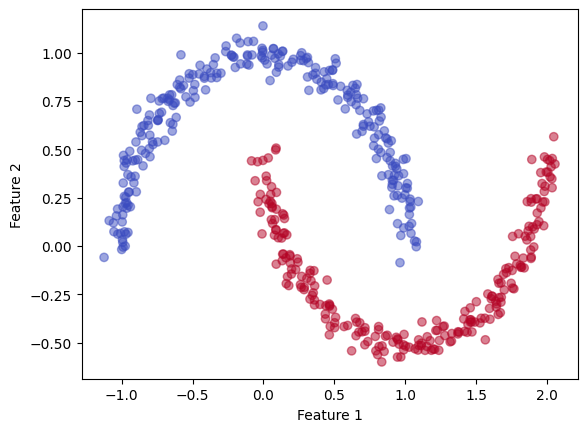

In [362]:
x_train, y_train, x_test, y_test = make_moons(500, 1000)
plt.scatter(x_train[:, 0], x_train[:, 1], c=y_train, cmap='coolwarm', alpha=0.5)
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.show()

In [363]:
def make_text(text: str, n_train: int, n_test: int):

    # Test
    rng = np.random.RandomState(0)
    text_path = TextPath((0, 0), text, size=1.0, prop=FontProperties(family="monospace", size=1.0))
    bbox = text_path.get_extents()
    xmin, ymin, xmax, ymax = bbox.x0, bbox.y0, bbox.x1, bbox.y1

    # Samples
    n_samples = n_train + n_test
    points = []
    while len(points) < n_samples:
        xs = rng.uniform(xmin, xmax, size=n_samples)
        ys = rng.uniform(ymin, ymax, size=n_samples)
        pts = np.column_stack([xs, ys])
        mask = text_path.contains_points(pts)
        points.extend(pts[mask])
    pts = np.asarray(points[:n_samples])

    # Train/Test
    x_train = pts[:n_train]
    x_test  = pts[n_train:]
    return x_train, x_test

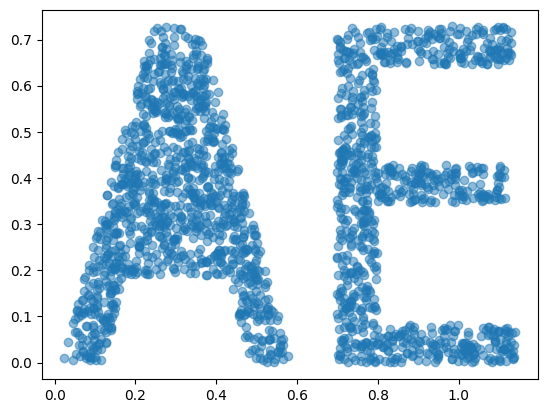

In [364]:
x_train, x_test = make_text("AE", 2000, 1000)
plt.scatter(x_train[:, 0], x_train[:, 1], alpha=0.5)
plt.show()

In [365]:
class DataLoader(torch.utils.data.DataLoader):

    def __init__(self, dataset, batch_size):
        super().__init__(dataset, batch_size=batch_size, shuffle=True, collate_fn=self.collate_fn)

    def collate_fn(self, batch):
        return jax.tree_util.tree_map(
            lambda x: jnp.asarray(x, dtype=jnp.float32), torch.utils.data.default_collate(batch)
        )

### Animation

In [366]:
def make_gif(traj: np.ndarray, fps: int = 20, figsize: tuple = (5, 5)) -> Image:

    # Consistent DPI
    fig = plt.figure(figsize=figsize)
    dpi = fig.get_dpi()
    plt.close(fig)

    frames = []
    for t in range(traj.shape[1]):

        # Limits
        x = traj[:, t, 0]
        y = traj[:, t, 1]
        x_min, x_max = x.min(), x.max()
        y_min, y_max = y.min(), y.max()
        pad_x = (x_max - x_min) * 0.01
        pad_y = (y_max - y_min) * 0.01

        # Plots
        fig, ax = plt.subplots(figsize=figsize, dpi=dpi)
        ax.scatter(x, y, alpha=0.7)
        ax.set_xlim(x_min - pad_x, x_max + pad_x)
        ax.set_ylim(y_min - pad_y, y_max + pad_y)
        ax.set_aspect('equal')
        ax.axis('off')

        # Render
        fig.canvas.draw()
        buf_arr = np.frombuffer(fig.canvas.buffer_rgba(), dtype=np.uint8)
        h, w = fig.canvas.get_width_height()
        frame = buf_arr.reshape((h, w, 4))[:, :, :3]  # drop alpha
        frames.append(frame)
        plt.close(fig)

    # Append extra copies of the last frame for pause
    last = frames[-1]
    frames.extend([last] * 100)

    # Write frames
    gif_buf = io.BytesIO()
    with imageio.get_writer(gif_buf, mode='I', format='GIF', fps=fps, loop=0) as writer:
        for frame in frames:
            writer.append_data(frame)
    gif_buf.seek(0)
    return Image(data=gif_buf.read(), format='gif')

## General API

Here we propose a simple API that has all the things a user of a generative model would want.

In [367]:
class Generator(ABC):

    @abstractmethod
    def __call__(self, n_samples: int, n_times: int, key: jax.Array) -> jax.Array:...

    @abstractmethod
    def test(self, test_loader: DataLoader, key: jax.Array) -> Dict:...

    @abstractmethod
    def fit(
        self, train_loader: DataLoader, val_loader: DataLoader, 
        optimizer: optax.GradientTransformation, n_epochs: int, key: jax.Array
    ) -> Dict:...

## Flow matching

In the following code, we will assume that our prior distribution is always the standard normal distribution 
$$
p(\pmb{x}, 0) = \mathcal{N}(\pmb{x} \mid \pmb{0}, \pmb{I}).
$$

In [368]:
class VectorField(ABC, nnx.Module):

    def __init__(self, n_feats: int):
        self.n_feats = n_feats

    @abstractmethod
    def __call__(self, x: jax.Array, t: jax.Array) -> jax.Array:...

In [451]:
class FM(Generator):

    def __init__(self, vector_field: VectorField):
        super().__init__()
        self.vector_field = vector_field

    def __call__(self, n_samples: int, n_times: int, key: jnp.ndarray) -> jnp.ndarray:
        return self.___call__(self.vector_field, n_samples, n_times, key)
    
    @staticmethod
    @partial(nnx.jit, static_argnames=('n_samples', 'n_times'))
    def ___call__(vector_field: VectorField, n_samples: int, n_times: int, key: jax.Array) -> jax.Array:
        t_grid = jnp.linspace(0.0, 1.0, n_times)
        f = lambda x0: odeint(vector_field, x0, t_grid)
        x0s = jax.random.normal(key, (n_samples, vector_field.n_feats))
        xts = jax.vmap(f)(x0s)
        return xts # (n_samples, n_times, n_feats)

    def fit(self, train_loader: DataLoader, val_loader: DataLoader, optimizer: optax.GradientTransformation, n_epochs: int, key: jax.Array) -> Dict:

        # Epochs
        opt = nnx.Optimizer(self.vector_field, optimizer)
        metrics = dict(train_loss=[], val_loss=[], test_loss=[])
        for _ in (pb := tqdm(range(n_epochs), desc='Training')):

            # Train
            loss, count = 0.0, 0
            for (train_batch,) in train_loader:
                key, train_key = jax.random.split(key)
                loss += self.train_step(train_batch, self.loss, self.vector_field, opt, train_key).item()
                count += 1
            metrics['train_loss'].append(loss / count)

            # Validate
            loss, count = 0.0, 0
            for (test_batch,) in val_loader:
                key, val_key = jax.random.split(key)
                loss += self.test_step(test_batch, self.loss, self.vector_field, val_key).item()
                count += 1
            metrics['val_loss'].append(loss / count)

            # Progress
            pb.set_postfix({'train_loss': metrics['train_loss'][-1], 'test_loss': metrics['val_loss'][-1]})

        return metrics

    @staticmethod
    @partial(nnx.jit, static_argnames='loss_fn')
    def train_step(
        batch: jax.Array, loss_fn: Callable[[VectorField, jax.Array, jax.Array], jax.Array], 
        vector_field: VectorField, opt: nnx.Optimizer, key: jax.Array
    ) -> jax.Array:
        key_batch = jax.random.split(key, batch.shape[0])
        loss_fn_batch = lambda vf: jax.vmap(loss_fn, in_axes=(None, 0, 0))(vf, batch, key_batch).mean()
        value, grad = nnx.value_and_grad(loss_fn_batch)(vector_field)
        opt.update(grad)
        return value
    
    @staticmethod
    @partial(nnx.jit, static_argnames='loss_fn')
    def test_step(
        batch: jax.Array, loss_fn: Callable[[VectorField, jax.Array, jax.Array], jax.Array], 
        vector_field: VectorField, key: jax.Array
    ) -> jax.Array:
        key_batch = jax.random.split(key, batch.shape[0])
        loss_fn_batch = lambda vf: jax.vmap(loss_fn, in_axes=(None, 0, 0))(vf, batch, key_batch).mean()
        return loss_fn_batch(vector_field)
    
    @staticmethod
    @abstractmethod
    def loss(vector_field: VectorField, x1: jax.Array, key: jax.Array) -> jax.Array:...

    def test(self, test_loader: DataLoader, key: jax.Array, *, n_times: int = 100, n_div_samples: int = 50) -> Dict:
        metrics = dict()
        value, count = 0.0, 0
        for (batch,) in test_loader:
            value += self.nll(self.vector_field, batch, n_times, n_div_samples, key).mean().item()
            count += 1
        metrics['nll'] = value / count
        return metrics
    
    @staticmethod
    @partial(nnx.jit, static_argnames=('n_times', 'n_div_samples'))
    def nll(vector_field: VectorField, x1s: jax.Array, n_times: int, n_div_samples: int, key: jax.Array) -> jax.Array:

        def _div(x: jax.Array, t: jax.Array, key: jax.Array) -> jax.Array:
            z = jax.random.normal(key, shape=x.shape)
            _, jvp = jax.jvp(lambda x_: vector_field(x_, t), (x,), (z,))
            dot = jnp.vdot(z, jvp)
            return dot
        
        def div(x: jax.Array, t: jax.Array, key: jax.Array) -> jax.Array:
            keys = jax.random.split(key, n_div_samples)
            div = jax.vmap(lambda key: _div(x, t, key))(keys).mean()
            return div
        
        def rhs(fg: jax.Array, t: jax.Array, key: jax.Array) -> jax.Array:
            f = fg[:-1]
            df = - vector_field(f, 1.0 - t)
            dg = div(f, 1.0 - t, key)
            dfg = jnp.array([*df, dg])
            return dfg

        def _likelihood(x1: jax.Array, key: jax.Array) -> jax.Array:
            f0g0 = jnp.array([*x1, 0.0])
            _rhs = lambda fg, t: rhs(fg, t, key)
            t_grid = jnp.linspace(0.0, 1.0, n_times)
            traj = odeint(_rhs, f0g0, t_grid) # (t_grid, n_feats)
            f1 = traj[-1, :-1]
            g1 = traj[-1, -1]
            logp0 = -0.5 * (jnp.sum(jnp.square(f1)) + f1.shape[0] * jnp.log(2 * jnp.pi))
            logp1 = logp0 - g1
            nll = -logp1
            return nll

        keys = jax.random.split(key, x1s.shape[0])
        nlls = jax.vmap(_likelihood, in_axes=(0, 0))(x1s, keys)
        return nlls # (n_samples,)
    

So now were are left with two things to define ourselves:
- the vector field,
- the loss function

## Optimal Transport

If we let the conditional flow map be a straight line
$$
\pmb{\phi}(\pmb{x}_0, t \mid \pmb{x}_1) = (1 - t) \pmb{x}_0 + t \pmb{x}_1
$$
then the conditional vector field is the time derrivative
$$
\pmb{v}(\pmb{x}, t \mid \pmb{x}_1) = \frac{\pmb{x}_1 - \pmb{x}}{1 - t}.
$$
Assuming $\pmb{x}_0 \sim \mathcal{N}(\pmb{0}, \pmb{I})$, the statistic of a linear time-invariant SDE tell use the conditional probability path
$$
p(\pmb{x}, t \mid \pmb{x}_1) = \mathcal{N}\left(\pmb{x} \mid t \pmb{x}_1, (1 - t)^2 \pmb{I}\right)
$$
then the generating conditional vector field is

A squared norm Bregman divergence function gives us
$$
\mathcal{L}(\theta) = \mathbb{E}_{t \sim U[0, 1], \pmb{x}_0 \sim \mathcal{N}(\pmb{0}, \pmb{I}), \pmb{x}_1 \sim q} \lVert \pmb{u}(\pmb{x}, t, \theta) - (\pmb{x}_1 - \pmb{x}_0) \rVert^2 
$$

In [457]:
class MLP(VectorField):

    def __init__(self, n_feats: int, hidden: List[int], time_dim: int, activation: Callable, rngs: nnx.Rngs):
        super().__init__(n_feats)

        # Temporal
        self.time_dim = (time_dim // 2) * 2
        self.proj = nnx.Linear(self.time_dim, self.time_dim, rngs=rngs)

        # Spatio-temporal
        layers = []
        layers.append(nnx.Linear(n_feats + self.time_dim, hidden[0], rngs=rngs))
        layers.append(activation)
        for i in range(len(hidden) - 1):
            layers.append(nnx.Linear(hidden[i], hidden[i+1], rngs=rngs))
            layers.append(activation)
        layers.append(nnx.Linear(hidden[-1], self.n_feats, rngs=rngs))
        self.module = nnx.Sequential(*layers)

    def time_embedding(self, t: jax.Array):
        half = self.time_dim // 2
        exp = jnp.arange(half) / (half - 1)
        freqs = 10000.0 ** (-exp)
        ang = 2 * jnp.pi * freqs * t
        fourier = jnp.concatenate([jnp.sin(ang), jnp.cos(ang)], axis=-1)
        return nnx.gelu(self.proj(fourier))

    def __call__(self, x: jax.Array, t: jax.Array) -> jax.Array:
        emb = self.time_embedding(t)
        return self.module(jnp.concatenate([x, emb], axis=-1))

In [458]:
class OT(FM):

    @staticmethod
    def loss(vector_field: VectorField, x1: jax.Array, key: jax.Array) -> jax.Array:
        kt, kx0 = jax.random.split(key)
        t = jax.random.uniform(kt)
        x0 = jax.random.normal(kx0, shape=x1.shape)
        xt = (1 - t) * x0 + t * x1
        vt = x1 - x0
        vthat = vector_field(xt, t)
        loss = jnp.mean(jnp.square(vthat - vt))
        return loss

Training: 100%|██████████| 500/500 [00:40<00:00, 12.44it/s, train_loss=0.972, test_loss=1.06] 


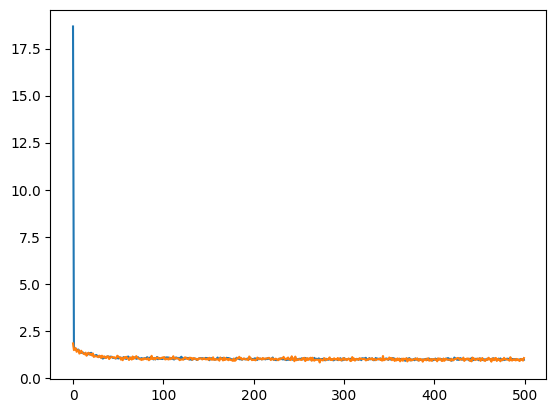

In [459]:
# Dataset
x_train, y_train, x_test, y_test = make_moons(1000, 500)
dataset = torch.utils.data.TensorDataset(torch.tensor(x_train))
train_loader = DataLoader(torch.utils.data.TensorDataset(torch.tensor(x_train)), 100)
val_loader = DataLoader(torch.utils.data.TensorDataset(torch.tensor(x_test)), 100)

# Model
model = OT(MLP(2, [200, 200, 200], 50, nnx.softplus, nnx.Rngs(0)))
metrics = model.fit(train_loader, val_loader, optax.adamw(1e-2), 500, jax.random.PRNGKey(0))
plt.plot(metrics['train_loss'])
plt.plot(metrics['val_loss'])
plt.show()

In [462]:
res = model.test(val_loader, jax.random.PRNGKey(0))
res

{'nll': 0.6822643160820008}

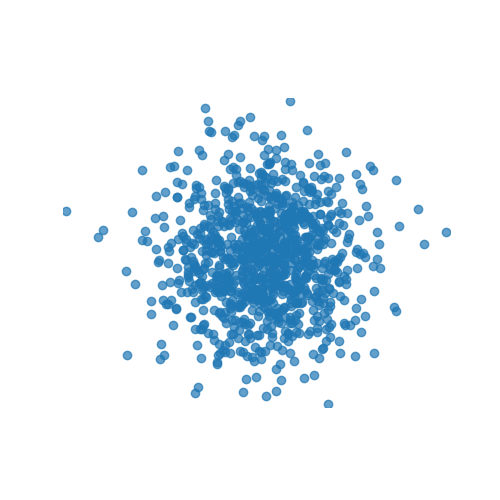

In [463]:
traj = model(1000, 100, jax.random.PRNGKey(0))
make_gif(traj, fps=32)

## Denoiser formulation



Using Bayes rule
$$
p(\pmb{x}_1 \mid \pmb{x}, t) = \frac{p(\pmb{x}, t \mid \pmb{x}_1) q(\pmb{x}_1)}{p(\pmb{x}, t)}
$$
we can simplify the marginal vector field to
$$
\begin{aligned}
    \pmb{v}(\pmb{x}, t) &= \frac{1}{p(\pmb{x}, t)} \int_\mathcal{X} \pmb{v}(\pmb{x}, t \mid \pmb{x}_1) p(\pmb{x}, t \mid \pmb{x}_1) q(\pmb{x}_1) \mathrm{d}\pmb{x}_1 \\
    &= \int_\mathcal{X} \pmb{v}(\pmb{x}, t \mid \pmb{x}_1) p(\pmb{x}_1 \mid \pmb{x}, t) \mathrm{d}\pmb{x}_1 \\
    &= \int_\mathcal{X} (\pmb{x}_1 - \pmb{x}) p(\pmb{x}_1 \mid \pmb{x}, t) \mathrm{d}\pmb{x}_1 \\
    &= \mathbb{E}[\pmb{x}_1 \mid \pmb{x}, t] - \pmb{x}.
\end{aligned}
$$

In [527]:
class DenoiserMLP(MLP):
    
    def denoiser(self, x: jax.Array, t: jax.Array) -> jax.Array:
        emb = self.time_embedding(t)
        x1hat = self.module(jnp.concatenate([x, emb], axis=-1))
        return x1hat

    def __call__(self, x: jax.Array, t: jax.Array) -> jax.Array:
        x1hat = self.denoiser(x, t)
        v = x1hat - x
        return v

Training: 100%|██████████| 1000/1000 [01:53<00:00,  8.82it/s, train_loss=1.98, test_loss=1.98]


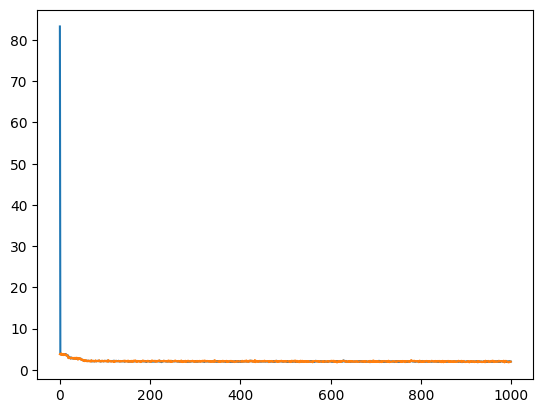

In [529]:
# Dataset
x_train, y_train, x_test, y_test = make_moons(1000, 500)
dataset = torch.utils.data.TensorDataset(torch.tensor(x_train))
train_loader = DataLoader(torch.utils.data.TensorDataset(torch.tensor(x_train)), 100)
val_loader = DataLoader(torch.utils.data.TensorDataset(torch.tensor(x_test)), 100)

# Model
model = OT(DenoiserMLP(2, [200, 200, 200], 50, nnx.softplus, nnx.Rngs(0)))
metrics = model.fit(train_loader, val_loader, optax.adamw(1e-2), 1000, jax.random.PRNGKey(0))
plt.plot(metrics['train_loss'])
plt.plot(metrics['val_loss'])
plt.show()

In [530]:
res = model.test(val_loader, jax.random.PRNGKey(0))
res

{'nll': 1.0875096559524535}

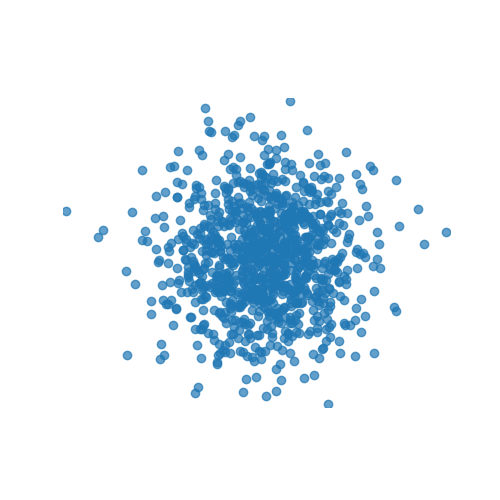

In [531]:
traj = model(1000, 100, jax.random.PRNGKey(0))
make_gif(traj, fps=32)

## Idempotency

Something we know about the denoiser is that it should be idempotent on the boundaries:
$$
\mathbb{E}[\pmb{x}_1 \mid \pmb{x}, 0] = \pmb{x}_1 \quad \mathbb{E}[\pmb{x}_1 \mid \pmb{x}, 1] = \mathbb{E}[\pmb{x}_1 \mid \mathbb{E}[\pmb{x}_1 \mid \pmb{x}, 1], 1]
$$

In [536]:
class Idempotent(FM):

    @staticmethod
    def loss(vector_field: VectorField, x1: jax.Array, key: jax.Array) -> jax.Array:

        # Standard flow matching loss
        kt, kx0 = jax.random.split(key)
        t = jax.random.uniform(kt)
        x0 = jax.random.normal(kx0, shape=x1.shape)
        xt = (1 - t) * x0 + t * x1
        vt = x1 - x0
        vthat = vector_field(xt, t)
        loss_fm = jnp.mean(jnp.square(vthat - vt))

        # Idempotency loss at t=0
        x0hat = vector_field.denoiser(x0, 0.0)
        x0hathat = vector_field.denoiser(x0hat, 0.0)
        loss_x0 = jnp.mean(jnp.square(x0hathat - x0hat))
        loss_x0 += jnp.mean(jnp.square(x0hathat - x0))

        # Idempotency loss at t=1
        x1hat = vector_field.denoiser(x0, 1.0)
        x1hathat = vector_field.denoiser(x1hat, 1.0)
        loss_x1 = jnp.mean(jnp.square(x1hathat - x1hat))
        loss_x1 += jnp.mean(jnp.square(x1hathat - x1))

        # xthat = vector_field.denoiser(xt, t)
        # xthathat = vector_field.denoiser(xthat, t)
        # loss_xt = jnp.mean(jnp.square(xthathat - xthat))
        
        return loss_fm + loss_x0 + loss_x1

Training: 100%|██████████| 1000/1000 [01:52<00:00,  8.85it/s, train_loss=1.5, test_loss=1.48]


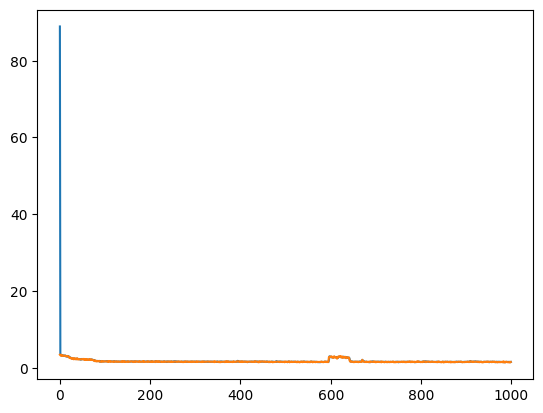

In [537]:
# Dataset
x_train, y_train, x_test, y_test = make_moons(1000, 500)
dataset = torch.utils.data.TensorDataset(torch.tensor(x_train))
train_loader = DataLoader(torch.utils.data.TensorDataset(torch.tensor(x_train)), 100)
val_loader = DataLoader(torch.utils.data.TensorDataset(torch.tensor(x_test)), 100)

# Model
model = Idempotent(DenoiserMLP(2, [200, 200, 200], 50, nnx.softplus, nnx.Rngs(0)))
metrics = model.fit(train_loader, val_loader, optax.adamw(1e-2), 1000, jax.random.PRNGKey(0))
plt.plot(metrics['train_loss'])
plt.plot(metrics['val_loss'])
plt.show()

In [538]:
res = model.test(val_loader, jax.random.PRNGKey(0))
res

{'nll': 0.548201960325241}

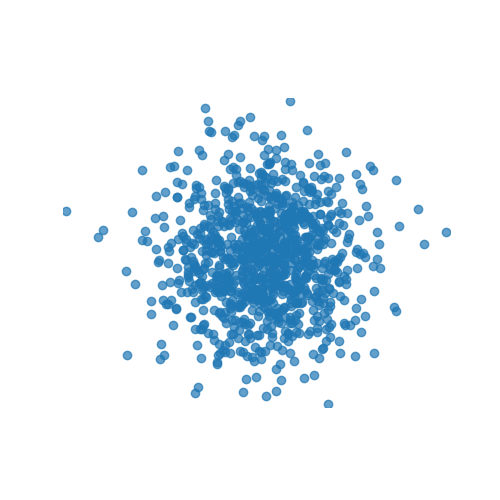

In [539]:
traj = model(1000, 100, jax.random.PRNGKey(0))
make_gif(traj, fps=32)